In [2]:
import pandas as pd
import seaborn as sns
import warnings
from matplotlib import pyplot as plt

warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv('movies.dat', sep='::', engine='python', encoding='latin1', header=None)
data

,0,1,2
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


In [4]:
head = ['MovieID', 'Title', 'Genres']
data.columns = head
data

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


In [5]:
usersHead = ['UserID', 'Gender', 'Age', 'Occupation', 'zip']
users = pd.read_csv('users.dat', sep='::', engine='python', header=None)
users.columns = usersHead
users

,UserID,Gender,Age,Occupation,zip
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455
...,...,...,...,...,...
6035,6036,F,25,15,32603
6036,6037,F,45,1,76006
6037,6038,F,56,1,14706
6038,6039,F,45,0,01060


In [6]:
zips = pd.read_csv('uszips.csv')
zips

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
0,601,18.18005,-66.75218,Adjuntas,PR,Puerto Rico,True,NaN,17113.0,102.7,72001,Adjuntas,"{""72001"": ""99.43"", ""72141"": ""0.57""}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico
1,602,18.36074,-67.17519,Aguada,PR,Puerto Rico,True,NaN,37751.0,476.0,72003,Aguada,"{""72003"": ""100""}",Aguada,72003,False,False,America/Puerto_Rico
2,603,18.45440,-67.12201,Aguadilla,PR,Puerto Rico,True,NaN,47081.0,574.9,72005,Aguadilla,"{""72005"": ""100""}",Aguadilla,72005,False,False,America/Puerto_Rico
3,606,18.16721,-66.93828,Maricao,PR,Puerto Rico,True,NaN,6392.0,58.3,72093,Maricao,"{""72093"": ""94.88"", ""72153"": ""3.78"", ""72121"": ""...",Maricao|Yauco|Sabana Grande,72093|72153|72121,False,False,America/Puerto_Rico
4,610,18.29032,-67.12244,Anasco,PR,Puerto Rico,True,NaN,26686.0,286.9,72011,Añasco,"{""72011"": ""99.45"", ""72003"": ""0.55""}",Añasco|Aguada,72011|72003,False,False,America/Puerto_Rico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33116,99923,55.97796,-130.03671,Hyder,AK,Alaska,True,NaN,14.0,0.3,2198,Prince of Wales-Hyder,"{""02198"": ""100""}",Prince of Wales-Hyder,02198,False,False,America/Sitka
33117,99925,55.55796,-132.97482,Klawock,AK,Alaska,True,NaN,908.0,6.3,2198,Prince of Wales-Hyder,"{""02198"": ""100""}",Prince of Wales-Hyder,02198,False,False,America/Sitka
33118,99926,55.12617,-131.48928,Metlakatla,AK,Alaska,True,NaN,1654.0,4.8,2198,Prince of Wales-Hyder,"{""02198"": ""100""}",Prince of Wales-Hyder,02198,False,False,America/Metlakatla
33119,99927,56.25100,-133.37572,Point Baker,AK,Alaska,True,NaN,0.0,0.0,2198,Prince of Wales-Hyder,"{""02198"": ""100""}",Prince of Wales-Hyder,02198,False,False,America/Sitka


In [7]:
users.dtypes

UserID         int64
Gender        object
Age            int64
Occupation     int64
zip           object
dtype: object

In [8]:
import re

users['zip'] = users['zip'].apply(lambda x: re.sub(r'\D', '', x))
users['zip'] = users['zip'].astype(int)

In [9]:
columns = ['zip', 'lat', 'lng', 'city']
usersmerged = pd.merge(users, zips[columns], how='inner', on='zip')
usersmerged

,UserID,Gender,Age,Occupation,zip,lat,lng,city
0,1,F,1,10,48067,42.49046,-83.13795,Royal Oak
1,2,M,56,16,70072,29.83601,-90.11042,Marrero
2,3,M,25,15,55117,44.99936,-93.09687,Saint Paul
3,4,M,45,7,2460,42.35196,-71.20830,Newtonville
4,5,M,25,20,55455,44.97358,-93.23316,Minneapolis
...,...,...,...,...,...,...,...,...
5799,6036,F,25,15,32603,29.64994,-82.35400,Gainesville
5800,6037,F,45,1,76006,32.78493,-97.10018,Arlington
5801,6038,F,56,1,14706,42.11331,-78.52578,Allegany
5802,6039,F,45,0,1060,42.32229,-72.63128,Northampton


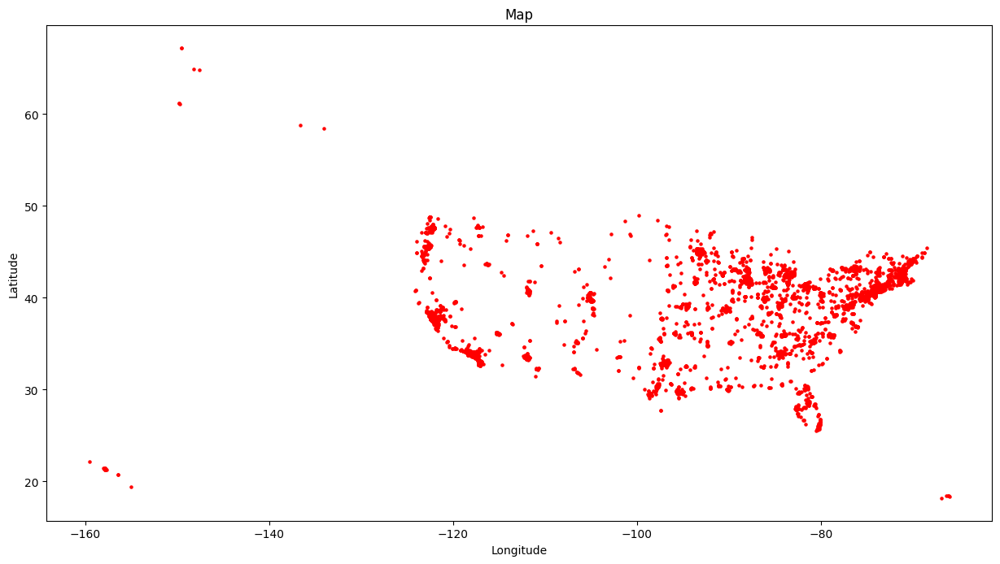

In [11]:
import geopandas as gpd
from shapely.geometry import Point

geo = [Point(lon, lat) for lon, lat in zip(usersmerged['lng'], usersmerged['lat'])]
map = gpd.GeoDataFrame(usersmerged, geometry=geo)

fig, ax = plt.subplots(figsize=(15, 12))

map.plot(ax=ax, marker='o', color='red', markersize=5)
plt.title('Map')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [12]:
ratingsHead = ['UserID', 'MovieID', 'Rating', 'Timestamp']
ratings = pd.read_csv('ratings.dat', sep='::', engine='python', header=None)
ratings.columns = ratingsHead
ratings

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


In [13]:
from datetime import datetime
ratings['Timestamp'] = ratings['Timestamp'].apply(lambda x: datetime.utcfromtimestamp(x).strftime('%Y-%m-%d %H:%M:%S'))
ratings

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,2000-12-31 22:12:40
1,1,661,3,2000-12-31 22:35:09
2,1,914,3,2000-12-31 22:32:48
3,1,3408,4,2000-12-31 22:04:35
4,1,2355,5,2001-01-06 23:38:11
...,...,...,...,...
1000204,6040,1091,1,2000-04-26 02:35:41
1000205,6040,1094,5,2000-04-25 23:21:27
1000206,6040,562,5,2000-04-25 23:19:06
1000207,6040,1096,4,2000-04-26 02:20:48


In [14]:
print(data.shape, ratings.shape, users.shape)

(3883, 3) (1000209, 4) (6040, 5)


In [15]:
print(data.isnull().sum(),
      ratings.isnull().sum(),
      users.isnull().sum())

MovieID    0
Title      0
Genres     0
dtype: int64 UserID       0
MovieID      0
Rating       0
Timestamp    0
dtype: int64 UserID        0
Gender        0
Age           0
Occupation    0
zip           0
dtype: int64


In [16]:
print(data.duplicated().sum(),
      ratings.duplicated().sum(),
      users.duplicated().sum())

0 0 0


In [17]:
stats = ratings.groupby('MovieID').agg({'Rating': ['mean', 'count']}).reset_index()
stats.columns = ['MovieID', 'AvgRating', 'Count']

stats

,MovieID,AvgRating,Count
0,1,4.146846,2077
1,2,3.201141,701
2,3,3.016736,478
3,4,2.729412,170
4,5,3.006757,296
...,...,...,...
3701,3948,3.635731,862
3702,3949,4.115132,304
3703,3950,3.666667,54
3704,3951,3.900000,40


Bayesian Average

In [18]:
C = stats['AvgRating'].mean()
m = stats['Count'].quantile(0.9)

def weighted_rating(x, m=m, C=C):
    v = x['Count']
    R = x['AvgRating']
    return (v / (v + m) * R) + (m / (v + m) * C)

stats['Weight'] = stats.apply(weighted_rating, axis=1)
stats.sort_values(by='Weight', ascending=False, inplace=True)

stats.head(10)

,MovieID,AvgRating,Count,Weight
309,318,4.554558,2227,4.229925
253,260,4.453694,2991,4.215501
802,858,4.524966,2223,4.207205
513,527,4.510417,2304,4.204639
1108,1198,4.477725,2514,4.199097
49,50,4.517106,1783,4.145979
2557,2762,4.406263,2459,4.139179
2651,2858,4.317386,3428,4.128147
579,593,4.351823,2578,4.106356
1848,2028,4.337354,2653,4.100450


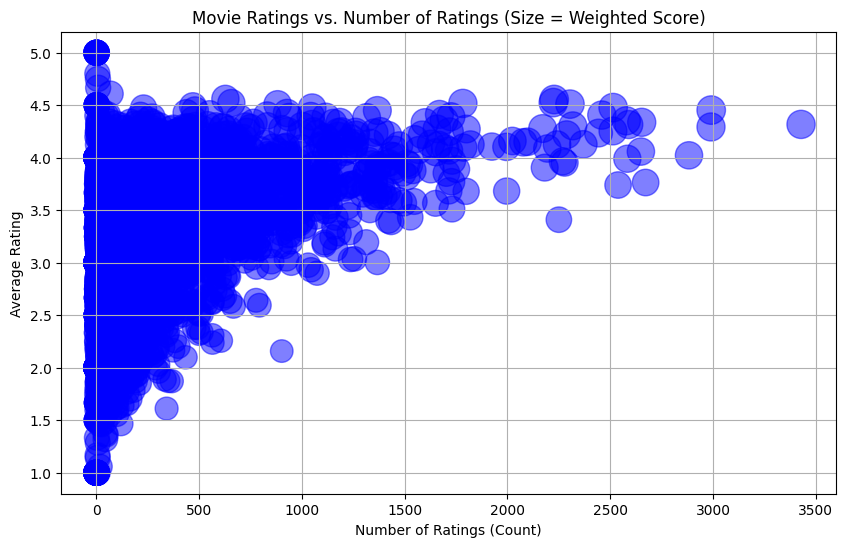

,MovieID,AvgRating,Count,Weight,Title
0,318,4.554558,2227,4.229925,"Shawshank Redemption, The (1994)"
1,260,4.453694,2991,4.215501,Star Wars: Episode IV - A New Hope (1977)
2,858,4.524966,2223,4.207205,"Godfather, The (1972)"
3,527,4.510417,2304,4.204639,Schindler's List (1993)
4,1198,4.477725,2514,4.199097,Raiders of the Lost Ark (1981)
5,50,4.517106,1783,4.145979,"Usual Suspects, The (1995)"
6,2762,4.406263,2459,4.139179,"Sixth Sense, The (1999)"
7,2858,4.317386,3428,4.128147,American Beauty (1999)
8,593,4.351823,2578,4.106356,"Silence of the Lambs, The (1991)"
9,2028,4.337354,2653,4.100450,Saving Private Ryan (1998)


In [19]:
plt.figure(figsize=(10,6))
plt.scatter(stats['Count'], stats['AvgRating'], alpha=0.5, s=stats['Weight']*100, color='blue')
plt.title('Movie Ratings vs. Number of Ratings (Size = Weighted Score)')
plt.xlabel('Number of Ratings (Count)')
plt.ylabel('Average Rating')
plt.grid(True)
plt.show()

tops = stats.merge(data[['MovieID', 'Title']], on='MovieID', how='left')
tops.head(10)

In [20]:
data = pd.merge(data, stats, how='left', on='MovieID')
data

,MovieID,Title,Genres,AvgRating,Count,Weight
0,1,Toy Story (1995),Animation|Children's|Comedy,4.146846,2077.0,3.910840
1,2,Jumanji (1995),Adventure|Children's|Fantasy,3.201141,701.0,3.220393
2,3,Grumpier Old Men (1995),Comedy|Romance,3.016736,478.0,3.150950
3,4,Waiting to Exhale (1995),Comedy|Drama,2.729412,170.0,3.142603
4,5,Father of the Bride Part II (1995),Comedy,3.006757,296.0,3.171889
...,...,...,...,...,...,...
3878,3948,Meet the Parents (2000),Comedy,3.635731,862.0,3.453831
3879,3949,Requiem for a Dream (2000),Drama,4.115132,304.0,3.496635
3880,3950,Tigerland (2000),Drama,3.666667,54.0,3.268375
3881,3951,Two Family House (2000),Drama,3.900000,40.0,3.273258


In [21]:
data['Genres'] = data['Genres'].str.split('|')
data

,MovieID,Title,Genres,AvgRating,Count,Weight
0,1,Toy Story (1995),"[Animation, Children's, Comedy]",4.146846,2077.0,3.910840
1,2,Jumanji (1995),"[Adventure, Children's, Fantasy]",3.201141,701.0,3.220393
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",3.016736,478.0,3.150950
3,4,Waiting to Exhale (1995),"[Comedy, Drama]",2.729412,170.0,3.142603
4,5,Father of the Bride Part II (1995),[Comedy],3.006757,296.0,3.171889
...,...,...,...,...,...,...
3878,3948,Meet the Parents (2000),[Comedy],3.635731,862.0,3.453831
3879,3949,Requiem for a Dream (2000),[Drama],4.115132,304.0,3.496635
3880,3950,Tigerland (2000),[Drama],3.666667,54.0,3.268375
3881,3951,Two Family House (2000),[Drama],3.900000,40.0,3.273258


In [22]:
data_exploded = data.explode('Genres')
ratings = pd.merge(ratings, data_exploded[['MovieID', 'Genres']], how='left', on='MovieID')
ratings

,UserID,MovieID,Rating,Timestamp,Genres
0,1,1193,5,2000-12-31 22:12:40,Drama
1,1,661,3,2000-12-31 22:35:09,Animation
2,1,661,3,2000-12-31 22:35:09,Children's
3,1,661,3,2000-12-31 22:35:09,Musical
4,1,914,3,2000-12-31 22:32:48,Musical
...,...,...,...,...,...
2101810,6040,1096,4,2000-04-26 02:20:48,Drama
2101811,6040,1097,4,2000-04-26 02:19:29,Children's
2101812,6040,1097,4,2000-04-26 02:19:29,Drama
2101813,6040,1097,4,2000-04-26 02:19:29,Fantasy


In [23]:
genres = ratings.groupby(['Genres']).agg({'Rating': ['mean', 'count']}).reset_index()
genres.columns = ['Genre', 'AvgRating', 'Popularity']
genres.sort_values(by='Popularity', ascending=False, inplace=True)
genres

,Genre,AvgRating,Popularity
4,Comedy,3.522099,356580
7,Drama,3.766332,354529
0,Action,3.491185,257457
15,Thriller,3.570466,189680
14,Sci-Fi,3.466521,157294
13,Romance,3.607465,147523
1,Adventure,3.477257,133953
5,Crime,3.708679,79541
10,Horror,3.215013,76386
3,Children's,3.422035,72186


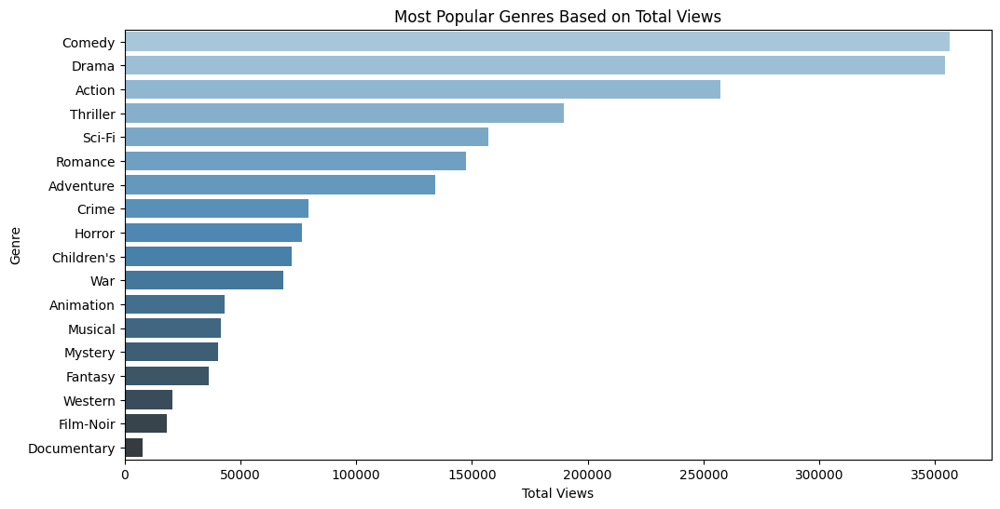

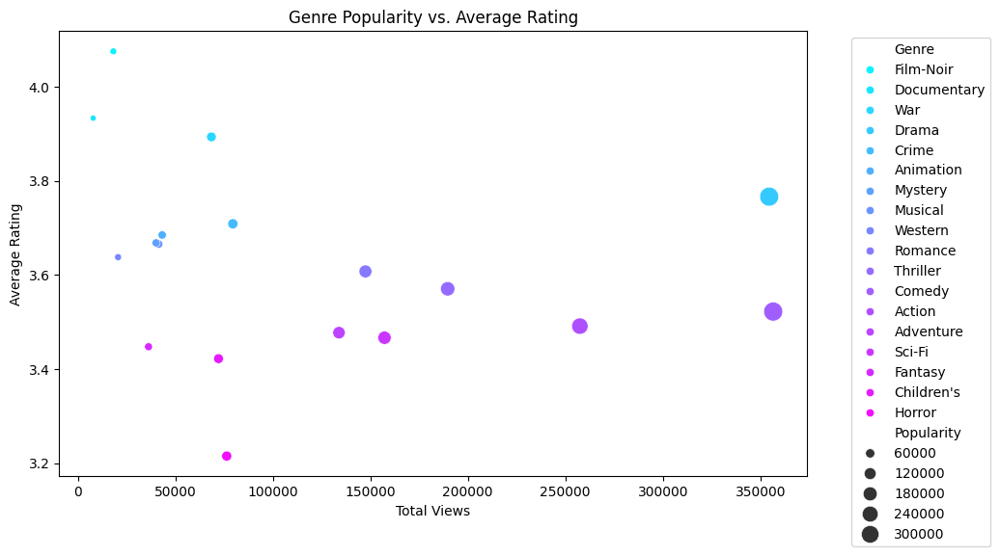

In [24]:
plt.figure(figsize=(12, 6))

sns.barplot(x='Popularity', y='Genre', data=genres, palette='Blues_d')
plt.title('Most Popular Genres Based on Total Views')
plt.xlabel('Total Views')
plt.ylabel('Genre')
plt.show()

genre_stats_sorted = genres.sort_values(by='AvgRating', ascending=False)

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Popularity', y='AvgRating', hue='Genre', size='Popularity', data=genres, palette='cool', sizes=(20, 200), hue_order=genre_stats_sorted['Genre'])
plt.title('Genre Popularity vs. Average Rating')
plt.xlabel('Total Views')
plt.ylabel('Average Rating')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [25]:
ratings

,UserID,MovieID,Rating,Timestamp,Genres
0,1,1193,5,2000-12-31 22:12:40,Drama
1,1,661,3,2000-12-31 22:35:09,Animation
2,1,661,3,2000-12-31 22:35:09,Children's
3,1,661,3,2000-12-31 22:35:09,Musical
4,1,914,3,2000-12-31 22:32:48,Musical
...,...,...,...,...,...
2101810,6040,1096,4,2000-04-26 02:20:48,Drama
2101811,6040,1097,4,2000-04-26 02:19:29,Children's
2101812,6040,1097,4,2000-04-26 02:19:29,Drama
2101813,6040,1097,4,2000-04-26 02:19:29,Fantasy


In [27]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

preferences = ratings.groupby(['UserID', 'Genres']).agg({'Rating': 'mean'}).reset_index()
preferences.columns = ['UserID', 'Genres', 'AvgRating']

preferences = preferences.pivot(index='UserID', columns='Genres', values='AvgRating').fillna(0)

scaler = StandardScaler()
prefScaled = scaler.fit_transform(preferences)

In [28]:
preferences

Genres,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
UserID,,,,,,,,,,,,,,,,,,
1,4.200000,4.000000,4.111111,4.250000,4.142857,4.000000,0.000000,4.428571,4.00,0.000000,0.000000,4.285714,0.000000,3.666667,4.333333,3.666667,5.000000,0.000000
2,3.500000,3.736842,0.000000,0.000000,3.560000,3.583333,0.000000,3.898734,3.00,4.000000,3.000000,0.000000,3.333333,3.708333,3.588235,3.483871,3.733333,4.333333
3,3.956522,4.000000,4.000000,4.000000,3.766667,0.000000,0.000000,4.000000,4.50,0.000000,2.666667,4.000000,3.000000,3.800000,3.833333,3.800000,4.000000,4.666667
4,4.157895,3.833333,0.000000,4.000000,0.000000,5.000000,0.000000,4.166667,4.50,0.000000,4.333333,0.000000,0.000000,4.000000,3.555556,3.500000,3.333333,4.500000
5,2.612903,3.000000,4.000000,3.833333,3.410714,3.285714,3.666667,3.096154,0.00,4.000000,2.800000,3.333333,3.125000,3.100000,3.066667,2.846154,3.500000,4.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,3.000000,2.987952,3.911765,3.444444,3.203065,3.528302,3.909091,3.505376,3.00,4.058824,2.986486,3.709677,3.411765,3.352459,2.834320,3.142857,3.785714,3.642857
6037,3.642857,4.000000,4.000000,3.666667,3.576271,3.833333,4.000000,3.877551,4.25,3.444444,4.111111,4.000000,3.692308,3.681818,3.692308,3.705882,4.000000,3.750000
6038,3.000000,4.000000,3.666667,3.000000,3.833333,0.000000,0.000000,3.888889,0.00,0.000000,2.500000,0.000000,0.000000,4.166667,4.000000,0.000000,4.000000,0.000000


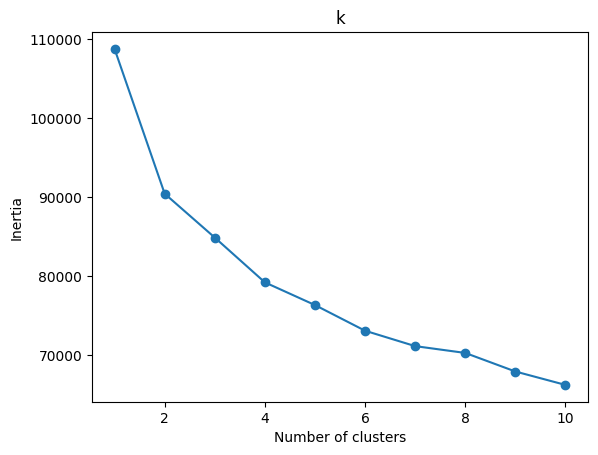

In [29]:
ax = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(prefScaled)
    ax.append(kmeans.inertia_)


plt.plot(range(1, 11), ax, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('k')
plt.show()

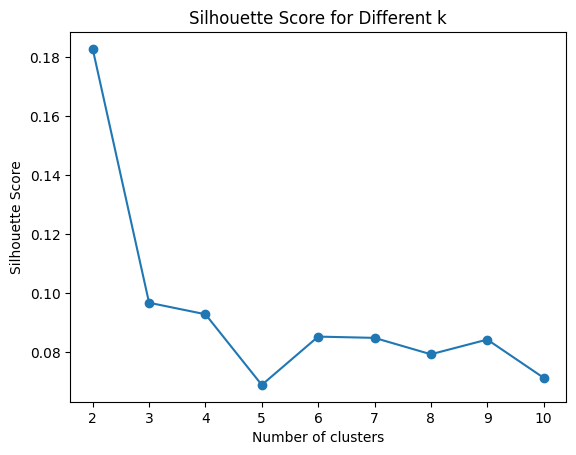

In [30]:
from sklearn.metrics import silhouette_score

silScore = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    clusters = kmeans.fit_predict(prefScaled)

    silAverage = silhouette_score(prefScaled, clusters)
    silScore.append(silAverage)

plt.plot(range(2, 11), silScore, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different k')
plt.show()

In [31]:
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(prefScaled)

preferences['Cluster'] = clusters
preferences

Genres,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Cluster
UserID,,,,,,,,,,,,,,,,,,,
1,4.200000,4.000000,4.111111,4.250000,4.142857,4.000000,0.000000,4.428571,4.00,0.000000,0.000000,4.285714,0.000000,3.666667,4.333333,3.666667,5.000000,0.000000,3
2,3.500000,3.736842,0.000000,0.000000,3.560000,3.583333,0.000000,3.898734,3.00,4.000000,3.000000,0.000000,3.333333,3.708333,3.588235,3.483871,3.733333,4.333333,3
3,3.956522,4.000000,4.000000,4.000000,3.766667,0.000000,0.000000,4.000000,4.50,0.000000,2.666667,4.000000,3.000000,3.800000,3.833333,3.800000,4.000000,4.666667,0
4,4.157895,3.833333,0.000000,4.000000,0.000000,5.000000,0.000000,4.166667,4.50,0.000000,4.333333,0.000000,0.000000,4.000000,3.555556,3.500000,3.333333,4.500000,3
5,2.612903,3.000000,4.000000,3.833333,3.410714,3.285714,3.666667,3.096154,0.00,4.000000,2.800000,3.333333,3.125000,3.100000,3.066667,2.846154,3.500000,4.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,3.000000,2.987952,3.911765,3.444444,3.203065,3.528302,3.909091,3.505376,3.00,4.058824,2.986486,3.709677,3.411765,3.352459,2.834320,3.142857,3.785714,3.642857,0
6037,3.642857,4.000000,4.000000,3.666667,3.576271,3.833333,4.000000,3.877551,4.25,3.444444,4.111111,4.000000,3.692308,3.681818,3.692308,3.705882,4.000000,3.750000,2
6038,3.000000,4.000000,3.666667,3.000000,3.833333,0.000000,0.000000,3.888889,0.00,0.000000,2.500000,0.000000,0.000000,4.166667,4.000000,0.000000,4.000000,0.000000,1


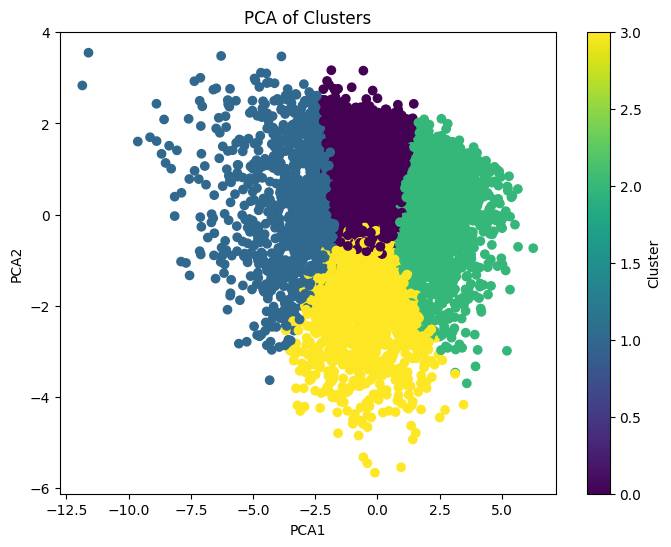

In [32]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_result = pca.fit_transform(prefScaled)

pca_df = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])
pca_df['Cluster'] = clusters

plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Cluster'], cmap='viridis', marker='o')
plt.title('PCA of Clusters')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar(label='Cluster')
plt.show()

In [33]:
ratingsCity = pd.merge(ratings, usersmerged[['UserID', 'city']], on='UserID', how='inner')

moviePopularity = ratingsCity.groupby(['city', 'MovieID']).agg(rating_count=('Rating', 'count')).reset_index()

movieMerged = pd.merge(moviePopularity, data[['MovieID', 'Title']], on='MovieID', how='inner')

def getMovies(df, city_name, top_n=10):
    city_movies = df[df['city'] == city_name]
    top_movies = city_movies.sort_values(by='rating_count', ascending=False).head(top_n)
    return top_movies[['city', 'Title', 'rating_count']]

city_name = 'New York'
top = getMovies(movieMerged, city_name)

print(f"\nTop 10 Movies by Rating Count in {city_name}:")
top



Top 10 Movies by Rating Count in New York:


,city,Title,rating_count
371685,New York,Star Wars: Episode VI - Return of the Jedi (1983),320
371671,New York,Star Wars: Episode V - The Empire Strikes Back...,290
371033,New York,Star Wars: Episode IV - A New Hope (1977),280
371980,New York,L.A. Confidential (1997),268
371951,New York,Men in Black (1997),248
371689,New York,Alien (1979),224
371304,New York,Fargo (1996),219
371613,New York,E.T. the Extra-Terrestrial (1982),216
371432,New York,"Godfather, The (1972)",207
372688,New York,Star Wars: Episode I - The Phantom Menace (1999),204


In [34]:
ratingsCity

,UserID,MovieID,Rating,Timestamp,Genres,city
0,1,1193,5,2000-12-31 22:12:40,Drama,Royal Oak
1,1,661,3,2000-12-31 22:35:09,Animation,Royal Oak
2,1,661,3,2000-12-31 22:35:09,Children's,Royal Oak
3,1,661,3,2000-12-31 22:35:09,Musical,Royal Oak
4,1,914,3,2000-12-31 22:32:48,Musical,Royal Oak
...,...,...,...,...,...,...
2020117,6040,1096,4,2000-04-26 02:20:48,Drama,Astoria
2020118,6040,1097,4,2000-04-26 02:19:29,Children's,Astoria
2020119,6040,1097,4,2000-04-26 02:19:29,Drama,Astoria
2020120,6040,1097,4,2000-04-26 02:19:29,Fantasy,Astoria


In [35]:
from sklearn.metrics.pairwise import cosine_similarity

preferences

Genres,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Cluster
UserID,,,,,,,,,,,,,,,,,,,
1,4.200000,4.000000,4.111111,4.250000,4.142857,4.000000,0.000000,4.428571,4.00,0.000000,0.000000,4.285714,0.000000,3.666667,4.333333,3.666667,5.000000,0.000000,3
2,3.500000,3.736842,0.000000,0.000000,3.560000,3.583333,0.000000,3.898734,3.00,4.000000,3.000000,0.000000,3.333333,3.708333,3.588235,3.483871,3.733333,4.333333,3
3,3.956522,4.000000,4.000000,4.000000,3.766667,0.000000,0.000000,4.000000,4.50,0.000000,2.666667,4.000000,3.000000,3.800000,3.833333,3.800000,4.000000,4.666667,0
4,4.157895,3.833333,0.000000,4.000000,0.000000,5.000000,0.000000,4.166667,4.50,0.000000,4.333333,0.000000,0.000000,4.000000,3.555556,3.500000,3.333333,4.500000,3
5,2.612903,3.000000,4.000000,3.833333,3.410714,3.285714,3.666667,3.096154,0.00,4.000000,2.800000,3.333333,3.125000,3.100000,3.066667,2.846154,3.500000,4.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,3.000000,2.987952,3.911765,3.444444,3.203065,3.528302,3.909091,3.505376,3.00,4.058824,2.986486,3.709677,3.411765,3.352459,2.834320,3.142857,3.785714,3.642857,0
6037,3.642857,4.000000,4.000000,3.666667,3.576271,3.833333,4.000000,3.877551,4.25,3.444444,4.111111,4.000000,3.692308,3.681818,3.692308,3.705882,4.000000,3.750000,2
6038,3.000000,4.000000,3.666667,3.000000,3.833333,0.000000,0.000000,3.888889,0.00,0.000000,2.500000,0.000000,0.000000,4.166667,4.000000,0.000000,4.000000,0.000000,1


In [36]:
cosine = cosine_similarity(preferences)

cosined = pd.DataFrame(cosine, index=preferences.index, columns=preferences.index)

cosined

UserID,1,2,3,4,5,6,7,8,9,10,...,6031,6032,6033,6034,6035,6036,6037,6038,6039,6040
UserID,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.740210,0.859800,0.785106,0.769257,0.941548,0.754002,0.848448,0.782485,0.863762,...,0.864894,0.839941,0.875122,0.624185,0.852365,0.810831,0.850427,0.817560,0.850504,0.799383
2,0.740210,1.000000,0.790903,0.845555,0.800739,0.749507,0.872220,0.835756,0.871912,0.863032,...,0.839332,0.861257,0.903468,0.847748,0.912267,0.833800,0.868155,0.682031,0.920224,0.836535
3,0.859800,0.790903,1.000000,0.788938,0.842332,0.934299,0.722944,0.899643,0.866628,0.915088,...,0.900450,0.882486,0.870102,0.676459,0.894873,0.881433,0.901677,0.792743,0.914575,0.874727
4,0.785106,0.845555,0.788938,1.000000,0.706469,0.790000,0.773948,0.811994,0.791298,0.812937,...,0.796436,0.772847,0.908409,0.659145,0.824543,0.756819,0.817376,0.679291,0.836522,0.760696
5,0.769257,0.800739,0.842332,0.706469,1.000000,0.840753,0.718038,0.897019,0.945195,0.950161,...,0.857648,0.955330,0.833058,0.811263,0.900566,0.975648,0.948582,0.731548,0.924216,0.963223
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,0.810831,0.833800,0.881433,0.756819,0.975648,0.863104,0.721327,0.880565,0.957729,0.983551,...,0.901113,0.987323,0.864087,0.794378,0.939538,1.000000,0.985129,0.709199,0.949441,0.992326
6037,0.850427,0.868155,0.901677,0.817376,0.948582,0.870220,0.777238,0.906823,0.944516,0.997771,...,0.935253,0.992551,0.902681,0.795188,0.951145,0.985129,1.000000,0.736976,0.964520,0.979048
6038,0.817560,0.682031,0.792743,0.679291,0.731548,0.795641,0.770774,0.813053,0.740427,0.753245,...,0.758000,0.723016,0.824648,0.604840,0.774906,0.709199,0.736976,1.000000,0.746716,0.667207


In [37]:
def get_most_similar_users(UserID, all_users, top_n=10):
    relatedUsers = all_users[UserID]

    similarUsers = relatedUsers.sort_values(ascending=False)
    similarUsers = similarUsers.drop(UserID).head(top_n)
    return similarUsers.index.tolist()

targetID = 50
similar_users = get_most_similar_users(targetID, cosined)

print(f"Top 10 most similar users to User {targetID}: {similar_users}")


Top 10 most similar users to User 50: [4309, 485, 5092, 4999, 8, 4119, 3334, 95, 2603, 4278]


In [38]:
ratings.head()

,UserID,MovieID,Rating,Timestamp,Genres
0,1,1193,5,2000-12-31 22:12:40,Drama
1,1,661,3,2000-12-31 22:35:09,Animation
2,1,661,3,2000-12-31 22:35:09,Children's
3,1,661,3,2000-12-31 22:35:09,Musical
4,1,914,3,2000-12-31 22:32:48,Musical


In [39]:
ratings = ratings.groupby(['UserID', 'MovieID']).agg({
    'Rating': 'first',
    'Timestamp': 'first',
    'Genres': lambda x: '|'.join(x)
}).reset_index()
ratings

,UserID,MovieID,Rating,Timestamp,Genres
0,1,1,5,2001-01-06 23:37:48,Animation|Children's|Comedy
1,1,48,5,2001-01-06 23:39:11,Animation|Children's|Musical|Romance
2,1,150,5,2000-12-31 22:29:37,Drama
3,1,260,4,2000-12-31 22:12:40,Action|Adventure|Fantasy|Sci-Fi
4,1,527,5,2001-01-06 23:36:35,Drama|War
...,...,...,...,...,...
1000204,6040,3683,4,2000-06-14 08:34:56,Drama|Film-Noir
1000205,6040,3703,4,2000-07-28 23:56:15,Action|Sci-Fi
1000206,6040,3735,4,2000-06-14 08:34:14,Crime|Drama
1000207,6040,3751,4,2000-07-28 23:59:42,Animation|Children's|Comedy


In [40]:
userSimilarities = cosined[targetID].drop(targetID).sort_values(ascending=False).head(10)
sims = pd.DataFrame(userSimilarities).reset_index()
sims.columns = ['UserID', 'Similarity']

sims

,UserID,Similarity
0,4309,0.994619
1,485,0.990535
2,5092,0.989644
3,4999,0.989303
4,8,0.987890
5,4119,0.985959
6,3334,0.985646
7,95,0.985252
8,2603,0.985250
9,4278,0.983007


In [41]:
movies = ratings[ratings['UserID'].isin(similar_users)]
himovies = movies.sort_values(by='Rating', ascending=False)

himovies

,UserID,MovieID,Rating,Timestamp,Genres
581,8,337,5,2000-12-31 02:37:28,Drama
580,8,296,5,2000-12-31 02:30:57,Crime|Drama
579,8,288,5,2000-12-31 02:23:11,Action|Thriller
574,8,253,5,2000-12-31 02:49:03,Drama|Horror
847684,5092,2396,5,2000-07-02 20:07:05,Comedy|Romance
...,...,...,...,...,...
12471,95,1179,1,2000-12-24 03:25:30,Crime|Drama|Film-Noir
428091,2603,1876,1,2000-11-09 13:34:14,Action|Drama|Sci-Fi|Thriller
688701,4119,2369,1,2000-08-04 03:22:58,Comedy|Romance
688703,4119,2413,1,2000-08-04 03:22:58,Comedy|Mystery


In [42]:
himovies = himovies.merge(sims, on='UserID')
himovies['Weight'] = himovies['Rating'] * himovies['Similarity']

himovies

,UserID,MovieID,Rating,Timestamp,Genres,Similarity,Weight
0,8,337,5,2000-12-31 02:37:28,Drama,0.987890,4.939451
1,8,296,5,2000-12-31 02:30:57,Crime|Drama,0.987890,4.939451
2,8,288,5,2000-12-31 02:23:11,Action|Thriller,0.987890,4.939451
3,8,253,5,2000-12-31 02:49:03,Drama|Horror,0.987890,4.939451
4,5092,2396,5,2000-07-02 20:07:05,Comedy|Romance,0.989644,4.948219
...,...,...,...,...,...,...,...
782,95,1179,1,2000-12-24 03:25:30,Crime|Drama|Film-Noir,0.985252,0.985252
783,2603,1876,1,2000-11-09 13:34:14,Action|Drama|Sci-Fi|Thriller,0.985250,0.985250
784,4119,2369,1,2000-08-04 03:22:58,Comedy|Romance,0.985959,0.985959
785,4119,2413,1,2000-08-04 03:22:58,Comedy|Mystery,0.985959,0.985959


In [43]:
himovies = himovies.groupby('MovieID').agg({
    'Weight': 'sum',
    'UserID': 'count'
}).rename(columns={'UserID': 'Count'})

top_movies = himovies.sort_values(by='Weight', ascending=False).head(10)
top_movies

,Weight,Count
MovieID,,
2028,35.562494,8
110,32.602181,7
2858,27.707925,6
1265,27.679198,7
2396,26.674284,6
3147,26.667334,6
2571,25.667326,6
356,23.712417,5
2268,22.717512,5


In [44]:
top_movies = top_movies.merge(data[['MovieID', 'Title']], on='MovieID', how='left')
top_movies

,MovieID,Weight,Count,Title
0,2028,35.562494,8,Saving Private Ryan (1998)
1,110,32.602181,7,Braveheart (1995)
2,2858,27.707925,6,American Beauty (1999)
3,1265,27.679198,7,Groundhog Day (1993)
4,2396,26.674284,6,Shakespeare in Love (1998)
5,3147,26.667334,6,"Green Mile, The (1999)"
6,2571,25.667326,6,"Matrix, The (1999)"
7,356,23.712417,5,Forrest Gump (1994)
8,2268,22.717512,5,"Few Good Men, A (1992)"
9,1784,19.774105,4,As Good As It Gets (1997)
